# Meg transform

This notebook corresponds to the section titled **"Preparation of MEG Data"** and is based on the `meg_data_preparation` function from the `MEEG_fMRI_whole_compa_script.py` script.

In this notebook, MEG data is converted from source estimate files to NIFTI format, enabling direct comparison with fMRI data. The MEG data is then thresholded at a user-defined top percentile alpha level and subjected to a minimum cluster size criterion. Additionally, visualizations of the conditions are provided after thresholding step.

## Import the necessary libraries

In [1]:
import nibabel as nib
from pathlib import Path
import numpy as np
import time
import matplotlib.pyplot as plt
import logging
import sys

from nilearn.plotting import plot_stat_map
from nilearn.image import resample_img
from nilearn.glm import threshold_stats_img
from nilearn.maskers import NiftiMasker

from mne import read_forward_solution, read_source_estimate, Info, SourceSpaces, convert_forward_solution

# Personal Imports
# Add the directory that contains the utils package to sys.path
sys.path.append(str(Path('..').resolve()))
from utils.utils import trackprogress, setup_logging
from utils.mask_utils import process_ribbon
from utils.meg_utils import stc_tp_as_volume
from utils.window_utils import get_max_index, get_poa_timepoint_sestim, compute_window_indices
from utils.threshold_utils import find_top_alpha_percent_threshold, resample_and_threshold_image

## Path to the dataset

Before running the notebooks, make sure to update the path in `config.py` to match your local setup.
- **`LOCAL_DIR`**: Set this to the directory where the BIDS-formatted data will be stored.

In [2]:
from config import LOCAL_DIR
local_dir = LOCAL_DIR

## Get the subjects names for this study

**Subject Exclusions and Issues:**

- **Subjects 1 and 2**: Excluded from analysis because their results in the native space are not available.
- **Subject 11**: Removed due to issues encountered during data acquisitions.
- **Subject 10**: Not available.

In [3]:
# Create a list of subjects from 'sub-03' to 'sub-17'
subjects = [f"sub-{i:02}" for i in range(3, 18) if i not in [11, 10]]

# Print the updated list to verify
print(subjects)

['sub-03', 'sub-04', 'sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-09', 'sub-12', 'sub-13', 'sub-14', 'sub-15', 'sub-16', 'sub-17']


## Define the tasks and contrasts

`tasks_conditions` is a dictionary that maps each task to its corresponding conditions.

In `task_tp`, windows are defined for each task. To update these settings, refer to the `config.py` file. The windows are intended to be time-locked around the peaks of activation triggered by the conditions.

In [4]:
from config import TASKS_CONDITIONS, MEG_TASKS_TP
# For each task associate the contrast of interest
tasks_conditions = TASKS_CONDITIONS

# For each task, define some timepoints that will be convert into nifti for comparison with other modalities
tasks_tp = MEG_TASKS_TP

You can adjust the following parameters:

- **`thres_param` (THRES_PARAM in `config.py`)**: Specifies the alpha top percentile for thresholding the data and the minimum cluster size. This parameter determines the thresholding of activation values.

- **`pos` (POS in `config.py`)**: Defines the resolution of the source estimates. Adjust this to set the level of detail for the source estimates.

- **`stc_algo` (MEG_STC_ALGO in `config.py`)**: The algorithm used to obtained the stc results.

- **`do_brain_masking` (DO_BRAIN_MASKING in `config.py`)**: Determines whether to apply brain masking to the EEG data after resampling into the fMRI space. While the source estimates are initially computed within a brain mask, interpolation may produce activations outside of this mask.

- **`mri_resolution` (MRI_RESOLUTION in `config.py`)**: Selects the resolution for interpolating the source estimates into NIfTI format. Two options are available:
  - Get the data into a downsampled space (46, 60, 49) before resampling to the fMRI resolution (112, 112, 66).
  - Interpolate directly into the anatomical MRI source resolution (256, 256, 256) before resampling to the fMRI resolution (112, 112, 66).

- **`plotting` (PLOTTING in `config.py`)**: Controls whether to plot each thresholded map. Set this to `True` if you want to visualize the thresholded activation maps.
                                            

In [9]:
# Define thresholding parameters
thres_param = {
    'MEG': {'alpha': 0.01, 'cluster_thresh': 15}
}

# Define stc resolution
pos = 3 # 3, 5 mm

# Define the stc algo to use
stc_algo = sLORETA

# Variable to choose if you want to masked the resampled interpolation by the brian mask before thresholding
do_brain_masking = False

# Choose if you want to path per the (256, 256, 256) mri_resolution
mri_resolution = False

# Plot the thresholded images
plotting = True

In [10]:
# Setup logging
logger = setup_logging(local_dir, 'logger-meg_stc2nifti_notebook')

The following cell corresponds to the `meg_data_stc2nifti` function from `meg_utils.py`.

### Overview:

The function performs the following operations:

1. **Subject Loop:** Iterates through all subjects defined in `subjects`.
2. **Anatomical Image Loading:** If `plotting` is True, loads the anatomical image (`anat_img`).
3. **Brain Mask Loading:** Loads the brain mask for the subject.
4. **Forward Data Loading:** Loads the forward data (`fwd`) for the subject.
5. **Task Loop:** Iterates through tasks and their corresponding time windows.
6. **Condition Loop:** Iterates through conditions for each task.
7. **Source Estimates Loading:** Loads source estimates (`stc`) for each condition.
8. **Window Loop:** Iterates through the different windows of interest within each condition.
   - Identifies the time point where the source estimate is maximized within the window.
   - Saves the source estimate as a NIfTI file.
9. **MRI Interpolation:** If `mri_resolution` is enabled, interpolates the source estimate into MRI space, else save as a nifti in `stc` resolution
10. **Resampling:** Resamples the NIfTI file to fMRI resolution for future comparisons.
11. **Brain Masking:** If `do_brain_mask` is enabled, applies the brain mask to the resampled NIfTI file.
12. **Thresholding:** Applies a threshold to the resulting map, keeping only the top alpha percent of the data, with a minimum cluster size defined by `thres_param['MEG']['cluster_thresh']`.
13. **Plotting:** If `plotting` is enabled, visualizes the results.

Throughout each step, the NIfTI files are saved to allow for debugging and verification.

Beginning of processing, sub-03:
0.00 % completed
Reading forward solution from I:\9008_CBT_HNP\MEG-EEG-fMRI\dataset_bids\derivatives_2\sub-03\meg\forward\sub_03-pos_3-fwd.h5...
    No patch info available. The standard source space normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]
  Processing task: aud
    Processing condition: sine
      Time window: [0.16, 0.2]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


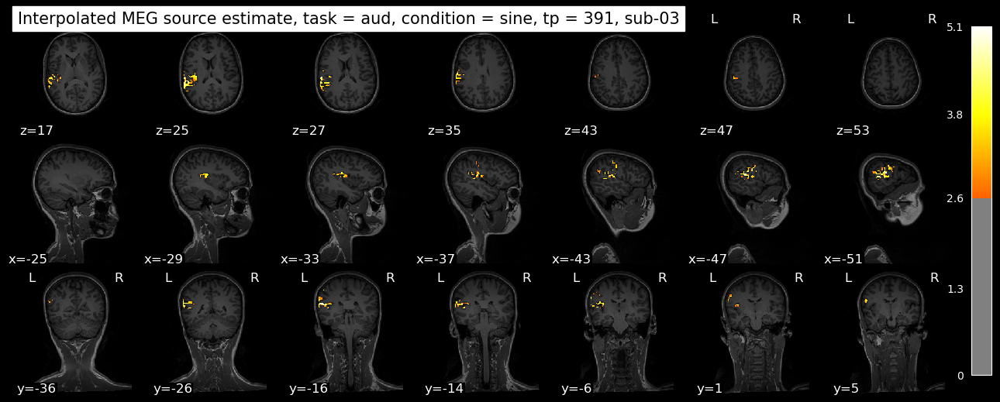

      Time window: [0.2, 0.26]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


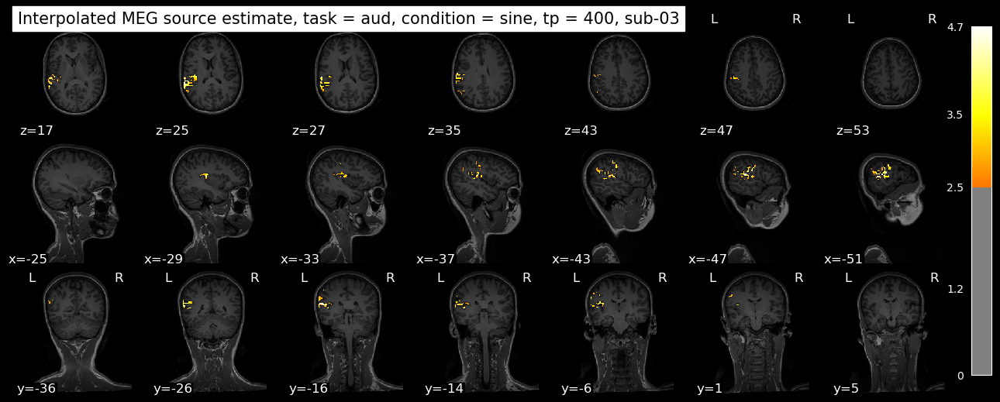

      Time window: [0.26, 0.32]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


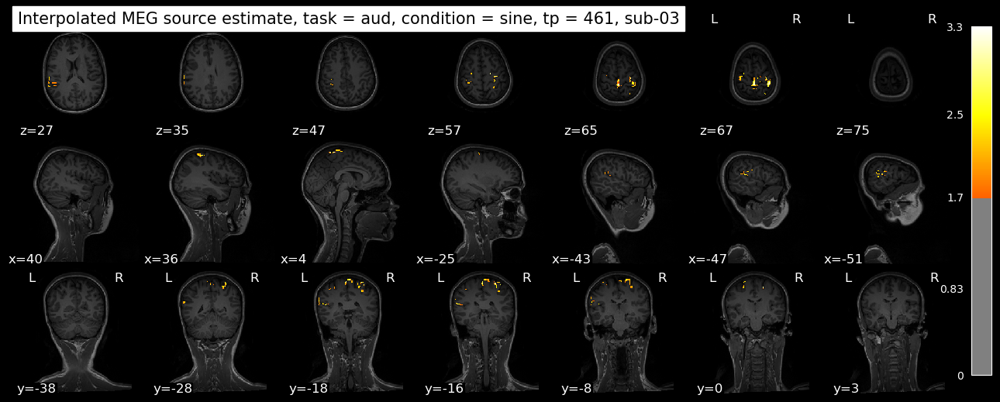

    Processing condition: piano1
      Time window: [0.16, 0.2]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


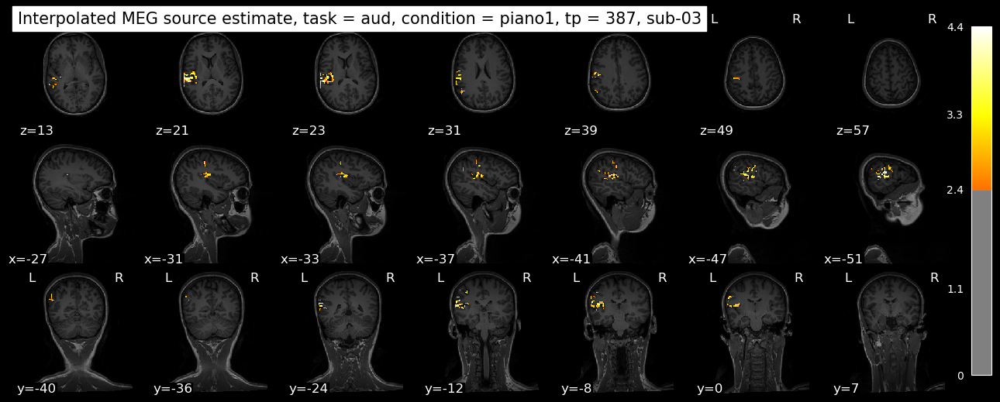

      Time window: [0.2, 0.26]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


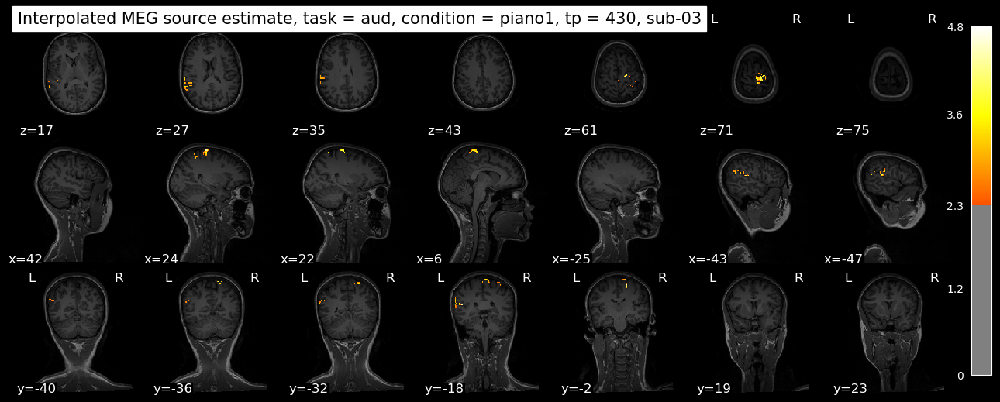

      Time window: [0.26, 0.32]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


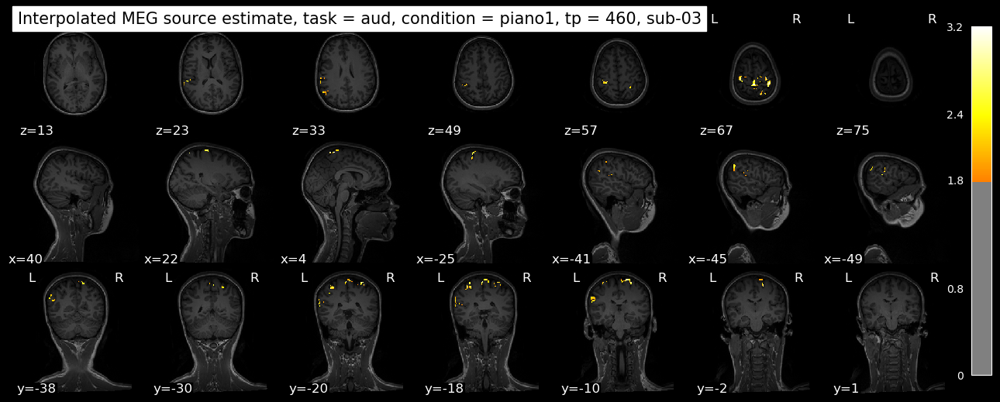

    Processing condition: piano4
      Time window: [0.16, 0.2]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


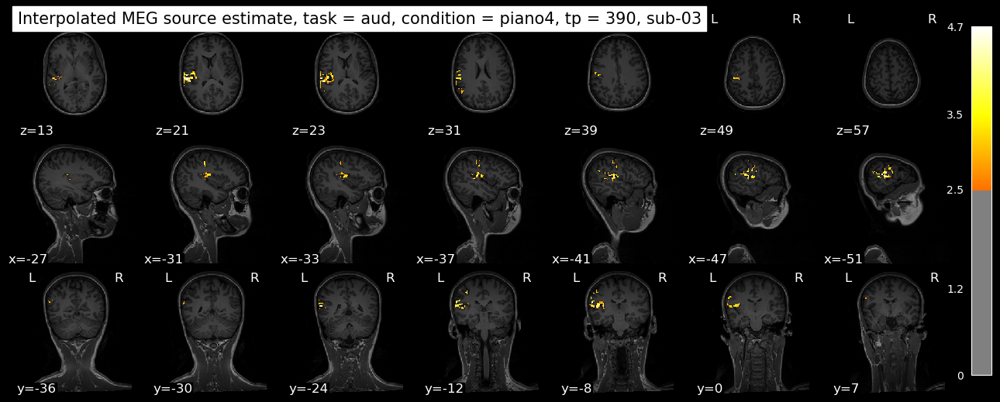

      Time window: [0.2, 0.26]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


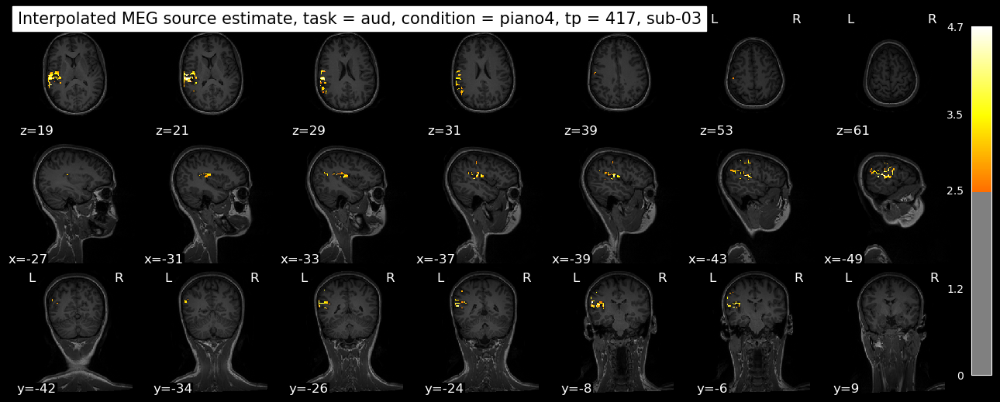

      Time window: [0.26, 0.32]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


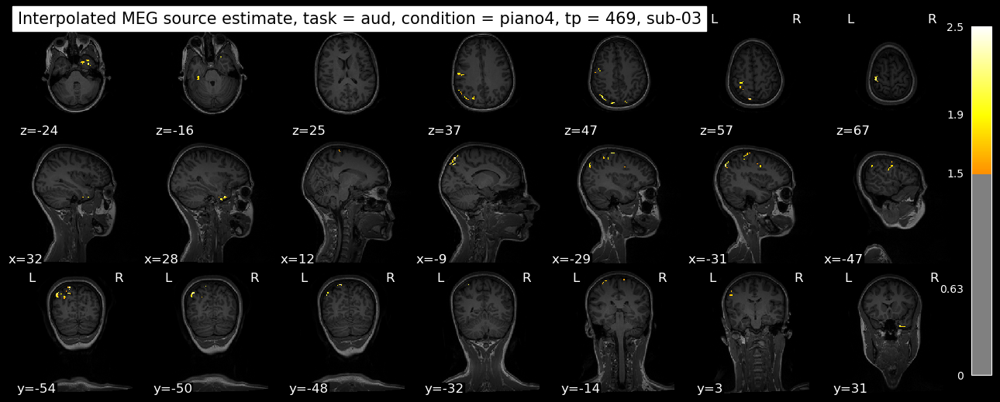

  Processing task: feet
    Processing condition: leftfoot
      Time window: [0.26, 0.35]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


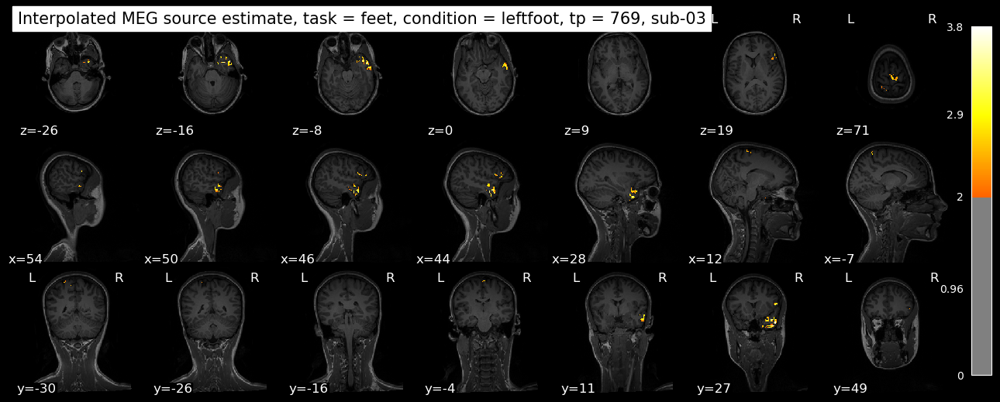

      Time window: [0.45, 0.53]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


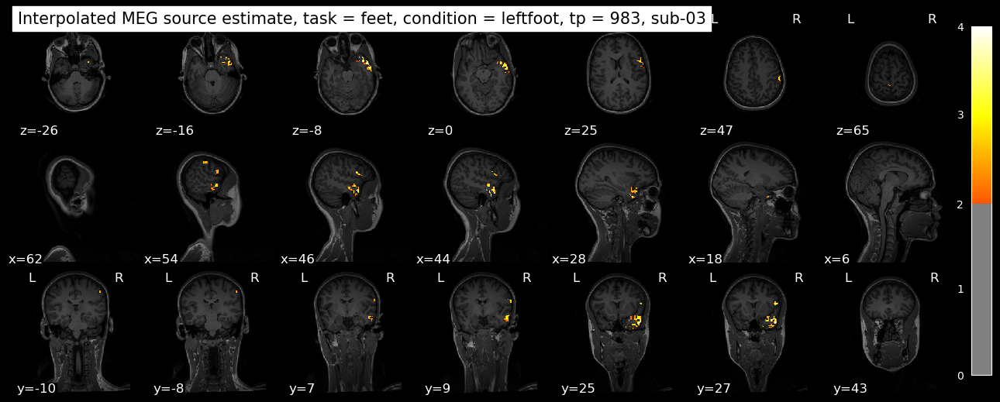

      Time window: [0.6, 0.7]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


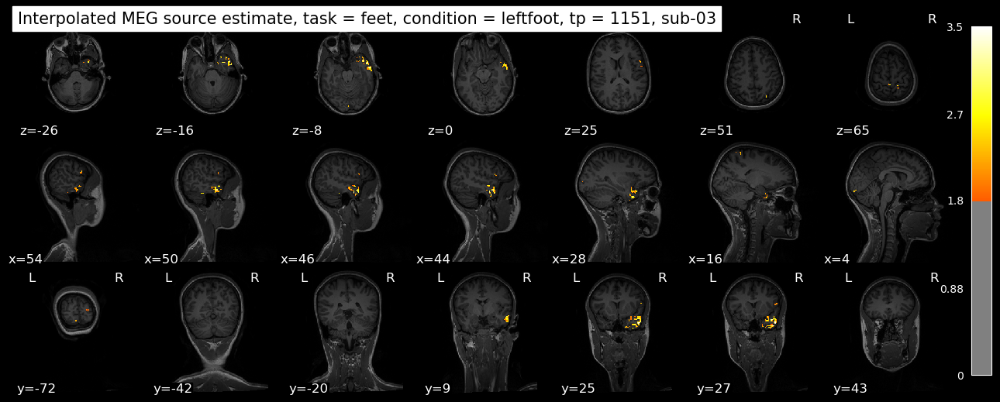

    Processing condition: rightfoot
      Time window: [0.26, 0.35]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


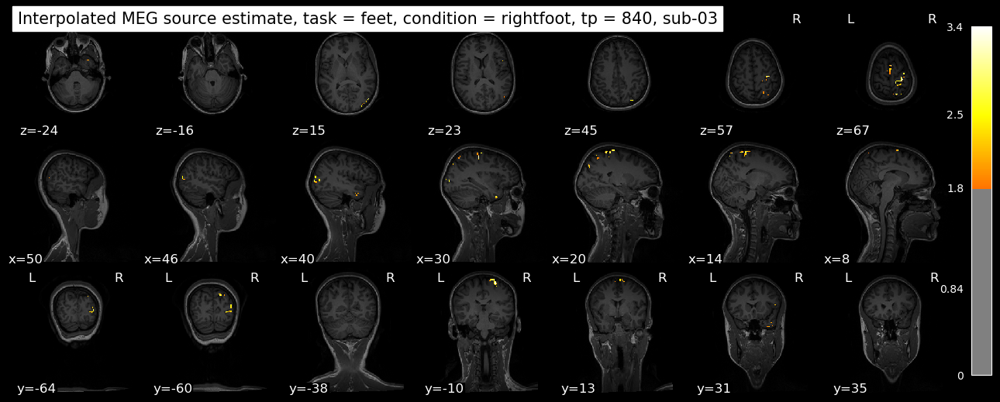

      Time window: [0.45, 0.53]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


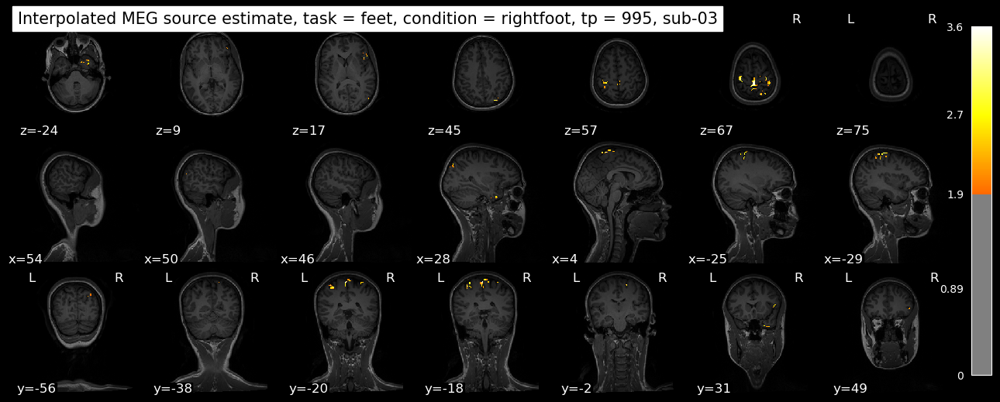

      Time window: [0.6, 0.7]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


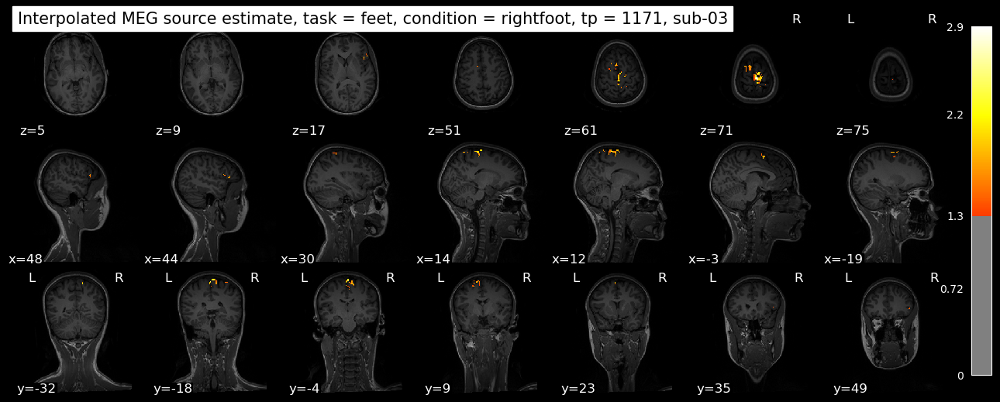

  Processing task: fing
    Processing condition: finger
      Time window: [0.06, 0.17]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


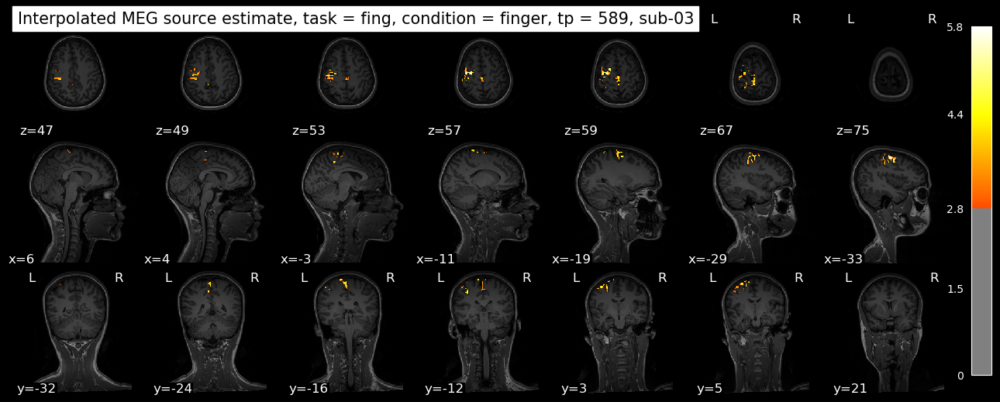

      Time window: [0.17, 0.26]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


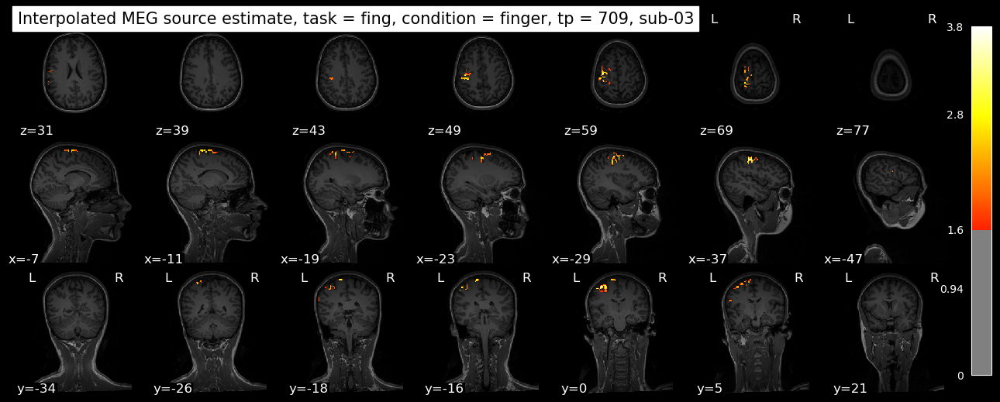

      Time window: [0.26, 0.4]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


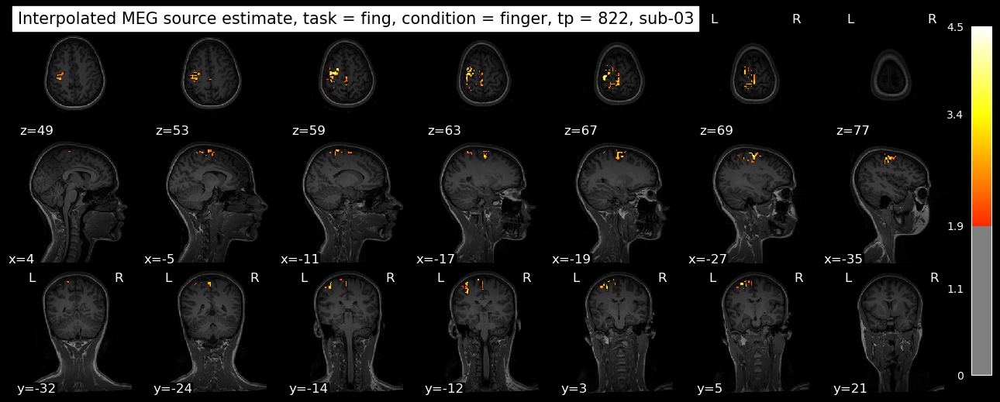

  Processing task: vis
    Processing condition: face
      Time window: [0.07, 0.11]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


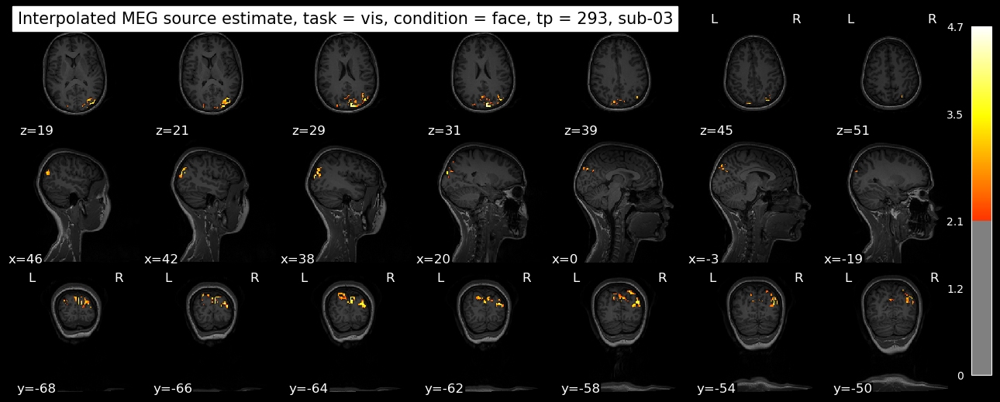

      Time window: [0.11, 0.18]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


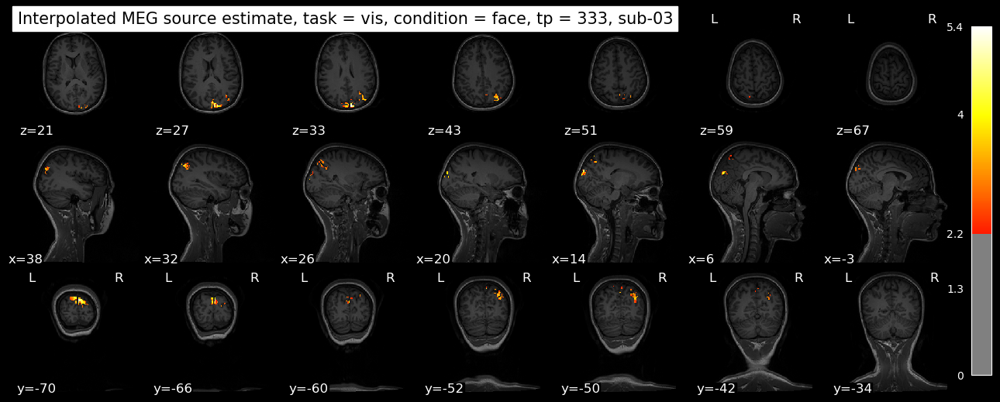

      Time window: [0.25, 0.4]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


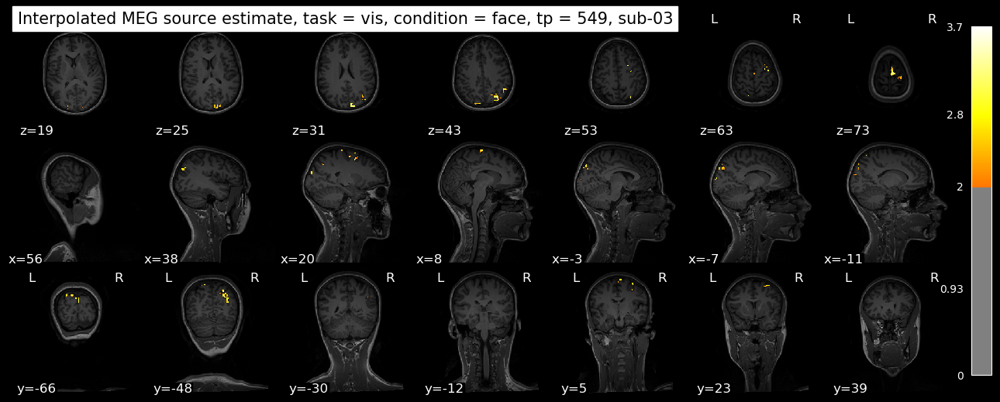

    Processing condition: scramble
      Time window: [0.07, 0.11]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


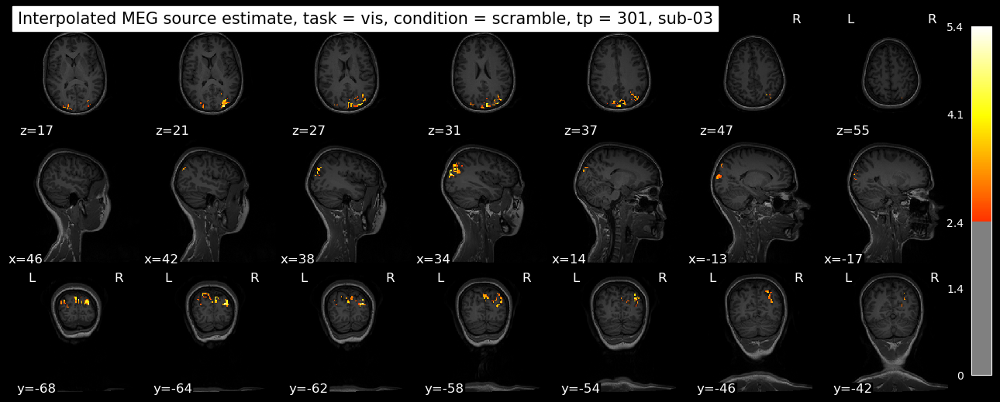

      Time window: [0.11, 0.18]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


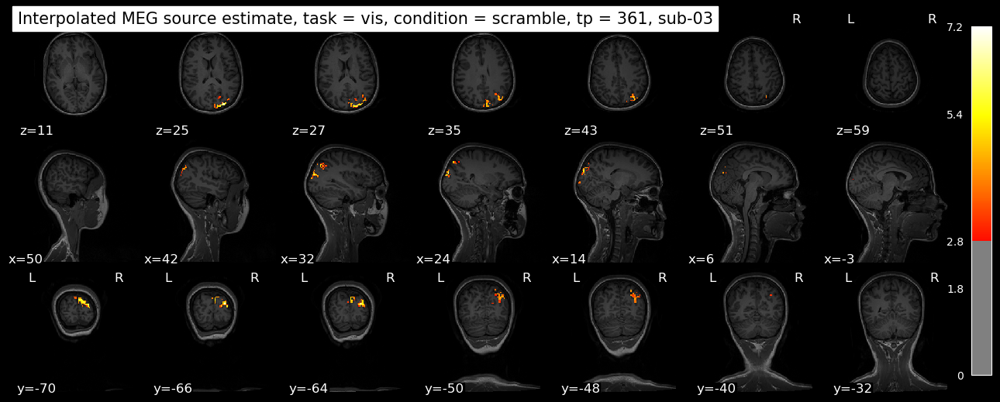

      Time window: [0.25, 0.4]s


C:\Users\lilia.ponselle\AppData\Local\anaconda3\envs\mne\Lib\site-packages\nilearn\image\resampling.py:809: UserWarning: Casting data from int16 to float32
  return resample_img(


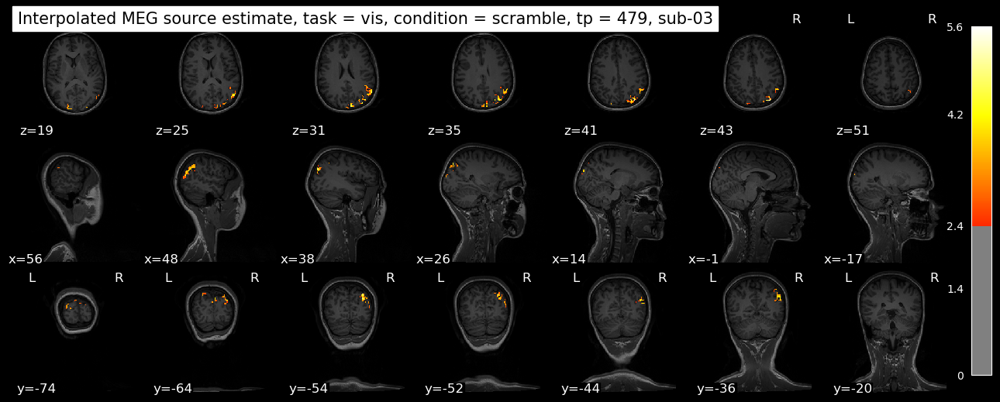

Beginning of processing, sub-04:
7.69 % completed
Estimated remaining time: 0.0 hours, 58.0 minutes.


FileNotFoundError: File does not exist: "I:\9008_CBT_HNP\MEG-EEG-fMRI\dataset_bids\derivatives_2\sub-04\meg\forward\sub_04-pos_3-fwd.h5"

In [11]:
# Start the time count to track the remaining computation time
start_time = time.time()

# Total number of subjects for progress tracking
tot_perf = len(subjects) 

# Threshold percentile
logger.info(f'Selected threshold top percentile alpha: {thres_param['MEG']['alpha']}')

# Minimum cluster size
logger.info(f'Selected cluster size > {thres_param['MEG']['cluster_thresh']}')

# Loop through subjects
for count_perf, sub in enumerate(subjects):

    print(f"Beginning of processing, {sub}:")
    logger.info(f"Beginning of processing, {sub}:")

    trackprogress(count_perf, tot_perf, start_time, logger)

    sub_derivatives_dir = Path(local_dir) / 'derivatives' / sub 

    try:
        if plotting == True:
            # Load the subjects T1
            anat_dir = Path(local_dir) / 'bids' / sub / 'anat' 
            anat_path = anat_dir / f"{sub}_T1w.nii.gz"
            anat_img = nib.load(anat_path)
            logger.info(f"Loaded T1 image for {sub}.")
    
        # Define directories and paths and load brain mask
        brainmask_outdir = sub_derivatives_dir / 'anat' 
        brainmask_path = brainmask_outdir / f"{sub}_brainmask_desc-resamp2fmri.nii.gz"
        
        if not brainmask_path.exists():
            logger.info(f'  Brain mask not found, creating a new one.')
            # Create a brain mask from the ribbon mask if it doesn't exist
            brain_mask = process_ribbon(sub, local_dir, brainmask_outdir, anat_img)
            
            # Load fMRI data to obtain the target affine and shape for resampling
            fmri_data_outdir = sub_derivatives_dir / 'func' / 'task-aud' 
            path_fmri_data = fmri_data_outdir / f"{sub}_task-aud_contrast-sine_desc-stat-t_statmap.nii.gz"
            logger.info(f'  Loading fMRI data from: {path_fmri_data}')
            fmri_data_img = nib.load(path_fmri_data)
        
            logger.info(f'  Resampling brain mask to match fMRI resolution.')
            resample_brain_mask = resample_and_threshold_image(
                brain_mask, fmri_data_img.affine, fmri_data_img.shape[:3], brainmask_path
            )
            # Free memory
            del brain_mask, fmri_data_outdir, path_fmri_data, fmri_data_img
        else:
            logger.info(f'  Loading existing resampled brain mask from: {brainmask_path}')
            resample_brain_mask = nib.load(brainmask_path)

        # Define forward and stc directory
        meg_dir = sub_derivatives_dir / 'meg' 

        # Load fwd data
        fwd_file = meg_dir / 'forward' / f"sub_{sub[-2:]}-pos_{pos}-fwd.h5"
        fwd = read_forward_solution(fwd_file)
        fwd["info"] = Info(fwd["info"])
        fwd["src"] = SourceSpaces(fwd["src"])
        fwd = convert_forward_solution(
            fwd, force_fixed=False, surf_ori=True, copy=False
        )
        
        # Iterate over tasks and their time windows
        for task, windows in tasks_tp.items():
            print(f"  Processing task: {task}")
            logger.info(f"  Processing task: {task}")
    
            try:
                outdir = meg_dir / 'stc_interpolated' / f'task-{task}' 
                outdir.mkdir(parents=True, exist_ok=True)
    
                # Loop through conditions
                for condition in tasks_conditions[task]:
                    print(f"    Processing condition: {condition}")
                    logger.info(f"    Processing condition: {condition}")
                    
                    try:
                        # Load the source estimates
                        stc_file = meg_dir / 'stc' / f"sub_{sub[-2:]}_task_{task}_proc_raw_meg-epo-{condition}-pos_{pos}-stc.h5"
                        stc = read_source_estimate(stc_file)
            
                        # Define start, step, and end times based on stc
                        t_start, t_step, t_end = stc.tmin, stc.tstep, stc.tmin + stc.tstep * (stc.shape[1] - 1)

                        for window in windows:
                            print(f"      Time window: {window}s")
                            logger.info(f"      Time window: {window}s")

                            try:
                                start_idx, end_idx = compute_window_indices(window, t_start, t_end, t_step, stc.shape[1])
                                
                                logger.info(f"      Indices: start={start_idx}, end={end_idx}")
                                
                                # Get the tp which corresponds to the time course maximum in this window
                                _, tp = get_poa_timepoint_sestim(stc.data[:, start_idx:end_idx], [start_idx, end_idx])
                        
                                logger.info(f'      Interpolating to mri space at time point: {tp}')
                                interpolated_path = outdir / f"{sub}_task-{task}_condition-{condition}_desc-meg-stcinterpol_tp-{tp}_pos-{pos}_stat-{stc_algo}_statmap.nii.gz"
                                interpolated_img =  stc_tp_as_volume(stc, fwd['src'], tp, dest = 'mri', mri_resolution=mri_resolution, format="nifti1", fname = interpolated_path)
                                
                                logger.info(f'      Saved interpolated image to: {interpolated_path}')
                    
                                logger.info(f'        Resampling the interpolated image.')
                                interpolated_img_resamp = resample_img(interpolated_img, resample_brain_mask.affine, resample_brain_mask.shape, interpolation = 'linear')
                                interpolated_path_resamp = outdir / f"{interpolated_path.with_suffix('').stem}_resamp.nii.gz"
                                nib.save(interpolated_img_resamp, interpolated_path_resamp)

                                # Apply brain masking if enabled
                                if do_brain_masking:
                                    logger.info(f'        Masking the resampled image.')
                                    brain_mask_nifti_masker = NiftiMasker(mask_img=resample_brain_mask)
                                    interpolated_img_masked = brain_mask_nifti_masker.inverse_transform(
                                        brain_mask_nifti_masker.fit_transform(interpolated_img_resamp)
                                    )
                                    interpolated_path_masked = outdir / f"{interpolated_path_resamp.with_suffix('').stem}_masked.nii.gz"
                                    nib.save(interpolated_img_masked, interpolated_path_masked)
                                    
                                    # Update references to the masked image
                                    interpolated_img_ = interpolated_img_masked
                                    interpolate_img_path_ = interpolated_path_masked
                                else:
                                    interpolated_img_ = interpolated_img_resamp
                                    interpolate_img_path_ = interpolated_path_resamp
                                    
                                logger.info(f'        Thresholding at the top alpha percentile.')
                                threshold = find_top_alpha_percent_threshold(interpolated_img_.get_fdata(), thres_param['MEG']['alpha'])
                                interpolated_img_thres, _ = threshold_stats_img(interpolated_img_, threshold = threshold, cluster_threshold = thres_param['MEG']['cluster_thresh'], height_control = None)

                                if plotting == True:
                                    # Plot the thresholded image
                                    plot_stat_map(
                                        interpolated_img_thres, anat_img, threshold = threshold, display_mode="mosaic",
                                        cmap=plt.cm.hot, title=f"Interpolated MEG source estimate, task = {task}, condition = {condition}, tp = {tp}, {sub}"
                                    )
                                    plt.show()
                                    plt.close()
                    
                                # Save the thresholded image
                                interpolated_path_thres = outdir / f"{interpolate_img_path_.with_suffix('').stem}_topercent-{thres_param['MEG']['alpha']}_cluster-{thres_param['MEG']['cluster_thresh']}.nii.gz"
                    
                                # Add a description the the image header with the threshold value
                                description = f"{condition}, threshold = {round(threshold, 3)}, alpha = {thres_param['MEG']['alpha']}, n > {thres_param['MEG']['cluster_thresh']}".encode('utf-8')[:80]
                                interpolated_img_thres.header['descrip'] = description
                                nib.save(interpolated_img_thres, interpolated_path_thres)
                                logger.info(f'        Saved thresholded image to: {interpolated_path_thres}')
            

                            except Exception as e:
                                logger.error(f"      Error processing window {window}: {str(e)}")
                                raise e
         
                    except Exception as e:
                        logger.error(f"    Error processing condition {condition}: {str(e)}")
                        raise e
            except Exception as e:
                logger.error(f"  Error processing task {task}: {str(e)}")
                raise e
    except Exception as e:
        logger.error(f"Error processing subject {sub}: {str(e)}")
        raise e
    
logger.info("Processing completed.")

### Plot the MEG data using MNE

In [ ]:
from utils.plot_utils import plot_stc

# Choose a subjects
sub = subjects[0]

directory = Path("I:\\9003_CBT_HNP_MEEG\\temp-mathieu\\meg-eeg-fMRI")

subjects_dir = directory / "freesurfer"
pos = 3  # (3, 5) mm

plot_stc(sub[-2:], directory, subjects_dir, pos)